# Reliance Industries: Stock Analysis and Forecasting

**Business Objective:**

1. Collect data of Reliance Industries Limited Stock Price from year 1990 to 2023.
2. For the Closing Price and Volume, make a forecast for the next 5 years, i.e. from 2024 to 2029.
3. Also find the factors that influence the stock prices and any special events during this period.
4. Using Streamlit, deploy the model with the best accuracy.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Importing dataset
reliance = pd.read_csv('500325.csv') 

In [3]:
reliance

,Date,Open Price,High Price,Low Price,Close Price,WAP,No.of Shares,No. of Trades,Total Turnover (Rs.),Deliverable Quantity,% Deli. Qty to Traded Qty,Spread High-Low,Spread Close-Open
0,29-December-2023,2608.05,2614.80,2579.15,2584.85,2587.234179,848448,42547,2.195134e+09,130653.0,15.40,35.65,-23.20
1,28-December-2023,2587.00,2611.35,2587.00,2605.80,2603.866737,183810,10929,4.786167e+08,76669.0,41.71,24.35,18.80
2,27-December-2023,2578.50,2599.35,2572.25,2586.35,2587.593434,103806,8408,2.686077e+08,52489.0,50.56,27.10,7.85
3,26-December-2023,2570.00,2592.90,2563.00,2577.50,2579.756103,90284,8523,2.329107e+08,43665.0,48.36,29.90,7.50
4,22-December-2023,2562.20,2580.55,2548.00,2564.70,2562.542998,524558,21877,1.344202e+09,52406.0,9.99,32.55,2.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8244,14-January-1991,107.50,107.50,101.25,103.75,0.000000,0,0,0.000000e+00,NaN,NaN,6.25,-3.75
8245,11-January-1991,102.50,110.00,100.00,108.75,0.000000,0,0,0.000000e+00,NaN,NaN,10.00,6.25
8246,9-January-1991,105.00,105.00,101.25,102.50,0.000000,0,0,0.000000e+00,NaN,NaN,3.75,-2.50
8247,7-January-1991,105.00,107.50,97.50,105.00,0.000000,0,0,0.000000e+00,NaN,NaN,10.00,0.00


# Data Preprocessing

In [4]:
reliance.head()

,Date,Open Price,High Price,Low Price,Close Price,WAP,No.of Shares,No. of Trades,Total Turnover (Rs.),Deliverable Quantity,% Deli. Qty to Traded Qty,Spread High-Low,Spread Close-Open
0,29-December-2023,2608.05,2614.80,2579.15,2584.85,2587.234179,848448,42547,2.195134e+09,130653.0,15.40,35.65,-23.20
1,28-December-2023,2587.00,2611.35,2587.00,2605.80,2603.866737,183810,10929,4.786167e+08,76669.0,41.71,24.35,18.80
2,27-December-2023,2578.50,2599.35,2572.25,2586.35,2587.593434,103806,8408,2.686077e+08,52489.0,50.56,27.10,7.85
3,26-December-2023,2570.00,2592.90,2563.00,2577.50,2579.756103,90284,8523,2.329107e+08,43665.0,48.36,29.90,7.50
4,22-December-2023,2562.20,2580.55,2548.00,2564.70,2562.542998,524558,21877,1.344202e+09,52406.0,9.99,32.55,2.50


In [5]:
reliance.tail()

,Date,Open Price,High Price,Low Price,Close Price,WAP,No.of Shares,No. of Trades,Total Turnover (Rs.),Deliverable Quantity,% Deli. Qty to Traded Qty,Spread High-Low,Spread Close-Open
8244,14-January-1991,107.5,107.5,101.25,103.75,0.0,0,0,0.0,NaN,NaN,6.25,-3.75
8245,11-January-1991,102.5,110.0,100.00,108.75,0.0,0,0,0.0,NaN,NaN,10.00,6.25
8246,9-January-1991,105.0,105.0,101.25,102.50,0.0,0,0,0.0,NaN,NaN,3.75,-2.50
8247,7-January-1991,105.0,107.5,97.50,105.00,0.0,0,0,0.0,NaN,NaN,10.00,0.00
8248,3-January-1991,107.5,107.5,95.00,97.50,0.0,0,0,0.0,NaN,NaN,12.50,-10.00


# EDA - Exploratory Data Analysis

Analysis is only based on Open, High, Low, close price and volume

In [6]:
reliance.drop({'WAP','No. of Trades','Total Turnover (Rs.)','Deliverable Quantity','% Deli. Qty to Traded Qty','Spread High-Low','Spread Close-Open'}, axis=1, inplace=True)

In [7]:
reliance.rename(columns = {'Open Price': 'OP','High Price':'HP','Low Price':'LP','Close Price':'CP','No.of Shares':'Volume'}, inplace=True)
reliance.head()

,Date,OP,HP,LP,CP,Volume
0,29-December-2023,2608.05,2614.80,2579.15,2584.85,848448
1,28-December-2023,2587.00,2611.35,2587.00,2605.80,183810
2,27-December-2023,2578.50,2599.35,2572.25,2586.35,103806
3,26-December-2023,2570.00,2592.90,2563.00,2577.50,90284
4,22-December-2023,2562.20,2580.55,2548.00,2564.70,524558


In [8]:
# Convert the 'Date' column to datetime objects first
reliance['Date'] =  pd.to_datetime(reliance['Date'])

**Sorting dataset by Date format**

In [9]:
reliance.sort_values(by='Date', inplace=True)
reliance.head()

,Date,OP,HP,LP,CP,Volume
8248,1991-01-03,107.5,107.5,95.00,97.50,0
8247,1991-01-07,105.0,107.5,97.50,105.00,0
8246,1991-01-09,105.0,105.0,101.25,102.50,0
8245,1991-01-11,102.5,110.0,100.00,108.75,0
8244,1991-01-14,107.5,107.5,101.25,103.75,0


In [10]:
# Finding duplicate values, if any
reliance.duplicated()

8248    False
8247    False
8246    False
8245    False
8244    False
        ...  
4       False
3       False
2       False
1       False
0       False
Length: 8249, dtype: bool

**There is no duplicated values**

In [11]:
# Finding null values, if any
reliance.isnull().sum()

Date      0
OP        0
HP        0
LP        0
CP        0
Volume    0
dtype: int64

**There is no null values**

**Descriptive Statistics**

In [12]:
reliance.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8249 entries, 8248 to 0
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    8249 non-null   datetime64[ns]
 1   OP      8249 non-null   float64       
 2   HP      8249 non-null   float64       
 3   LP      8249 non-null   float64       
 4   CP      8249 non-null   float64       
 5   Volume  8249 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 451.1 KB


In [13]:
reliance.describe()

,OP,HP,LP,CP,Volume
count,8249.000000,8249.000000,8249.000000,8249.000000,8.249000e+03
mean,909.491093,921.527628,896.968378,908.777052,1.804928e+06
std,731.885490,741.329501,722.125863,731.490906,7.996703e+06
min,92.500000,95.000000,88.750000,91.250000,0.000000e+00
25%,288.000000,292.700000,284.000000,288.500000,2.498540e+05
50%,814.450000,823.000000,805.000000,813.250000,6.749440e+05
75%,1213.900000,1232.750000,1193.250000,1212.000000,2.073058e+06
max,3235.000000,3252.100000,3135.250000,3216.300000,3.973114e+08


In [14]:
reliance.shape

(8249, 6)

In [15]:
reliance.columns

Index(['Date', 'OP', 'HP', 'LP', 'CP', 'Volume'], dtype='object')

In [16]:
reliance.set_index('Date',inplace=True)

In [17]:
reliance.corr()

,OP,HP,LP,CP,Volume
OP,1.000000,0.999768,0.999662,0.999481,-0.085091
HP,0.999768,1.000000,0.999565,0.999759,-0.083925
LP,0.999662,0.999565,1.000000,0.999747,-0.085651
CP,0.999481,0.999759,0.999747,1.000000,-0.084709
Volume,-0.085091,-0.083925,-0.085651,-0.084709,1.000000


**Every attributes are highly correlated except volume**

In [18]:
sns.set_style(style='darkgrid')

Text(0.5, 1.0, 'Low')

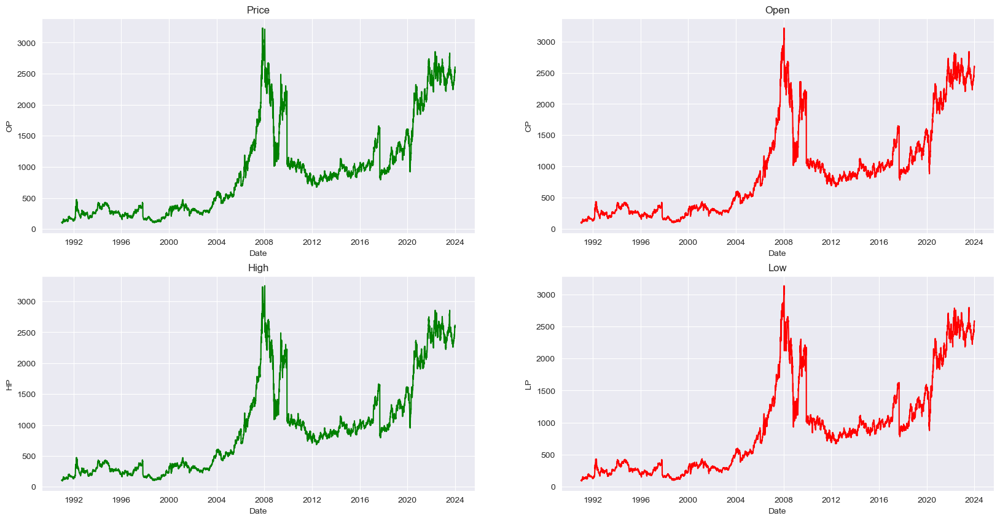

In [19]:
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.plot(reliance['OP'],color='green')
plt.xlabel('Date')
plt.ylabel('OP')
plt.title('Price')
#Plot 2
plt.subplot(2,2,2)
plt.plot(reliance['CP'],color='red')
plt.xlabel('Date')
plt.ylabel('CP')
plt.title('Open')
#Plot 3
plt.subplot(2,2,3)
plt.plot(reliance['HP'],color='green')
plt.xlabel('Date')
plt.ylabel('HP')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.plot(reliance['LP'],color='red')
plt.xlabel('Date')
plt.ylabel('LP')
plt.title('Low')

Text(0.5, 1.0, 'Low')

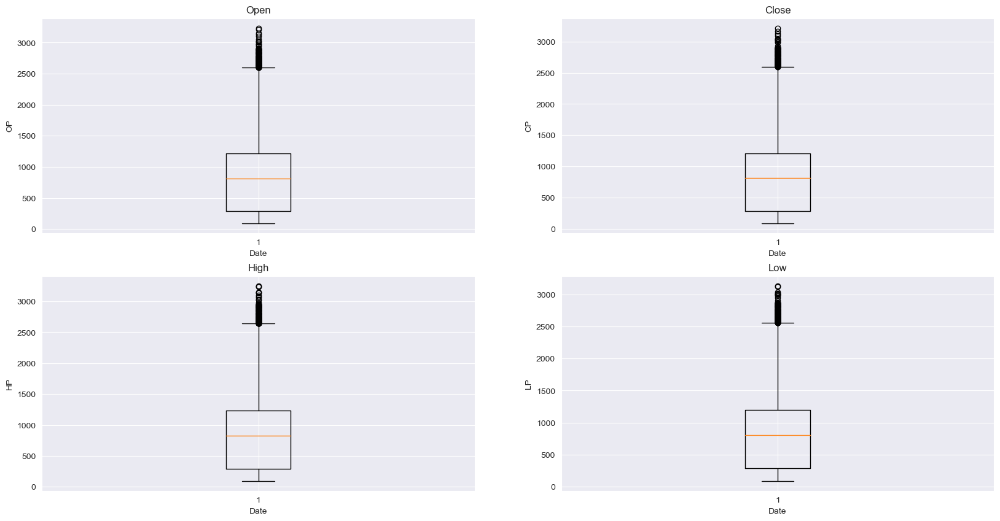

In [20]:
# Creating box-plots
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.boxplot(reliance['OP'])
plt.xlabel('Date')
plt.ylabel('OP')
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
plt.boxplot(reliance['CP'])
plt.xlabel('Date')
plt.ylabel('CP')
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
plt.boxplot(reliance['HP'])
plt.xlabel('Date')
plt.ylabel('HP')
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.boxplot(reliance['LP'])
plt.xlabel('Date')
plt.ylabel('LP')
plt.title('Low')

Text(0.5, 1.0, 'Low')

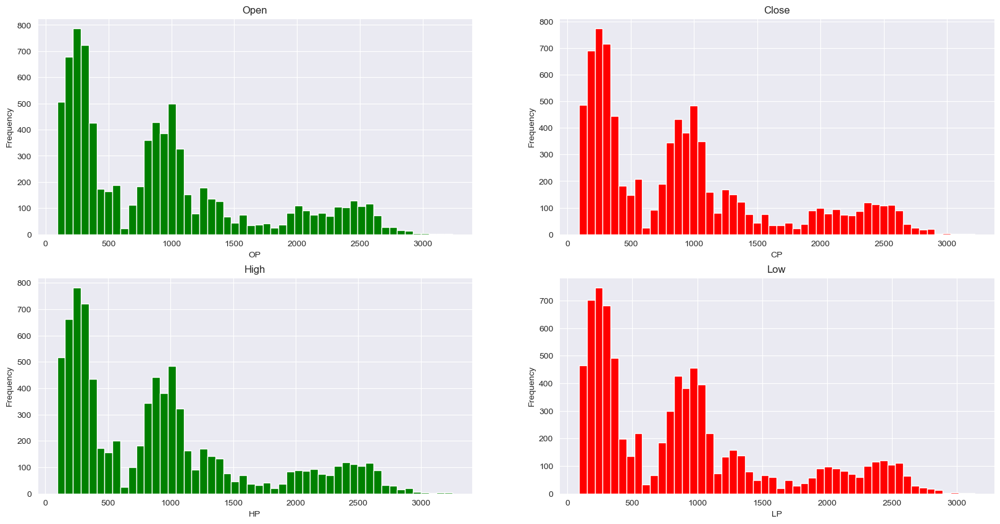

In [21]:
# Ploting Histogram
plt.figure(figsize=(20,10))
#Plot 1
plt.subplot(2,2,1)
plt.hist(reliance['OP'],bins=50, color='green')
plt.xlabel("OP")
plt.ylabel("Frequency")
plt.title('Open')
#Plot 2
plt.subplot(2,2,2)
plt.hist(reliance['CP'],bins=50, color='red')
plt.xlabel("CP")
plt.ylabel("Frequency")
plt.title('Close')
#Plot 3
plt.subplot(2,2,3)
plt.hist(reliance['HP'],bins=50, color='green')
plt.xlabel("HP")
plt.ylabel("Frequency")
plt.title('High')
#Plot 4
plt.subplot(2,2,4)
plt.hist(reliance['LP'],bins=50, color='red')
plt.xlabel("LP")
plt.ylabel("Frequency")
plt.title('Low')

Text(0.5, 1.0, 'Low')

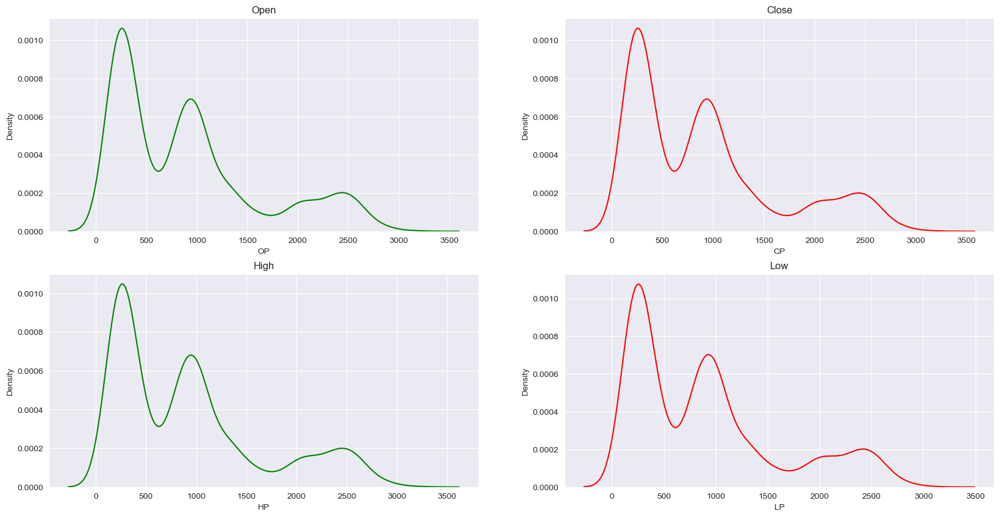

In [22]:
# KDE-Plots
plt.figure(figsize=(20,10))

#Plot 1
plt.subplot(2,2,1)
sns.kdeplot(reliance['OP'], color='green')
plt.title('Open')

#Plot 2
plt.subplot(2,2,2)
sns.kdeplot(reliance['CP'], color='red')
plt.title('Close')

#Plot 3
plt.subplot(2,2,3)
sns.kdeplot(reliance['HP'], color='green')
plt.title('High')

#Plot 4
plt.subplot(2,2,4)
sns.kdeplot(reliance['LP'], color='red')
plt.title('Low')

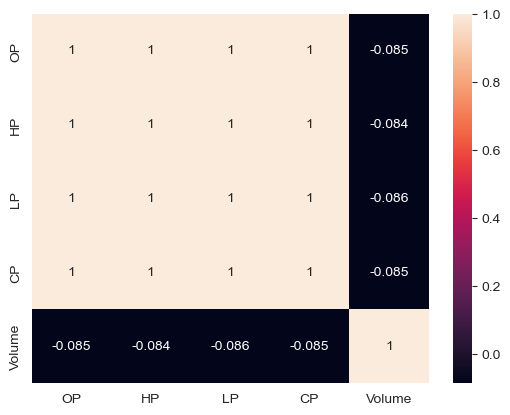

In [23]:
sns.heatmap(reliance.corr(),annot=True)
plt.show()

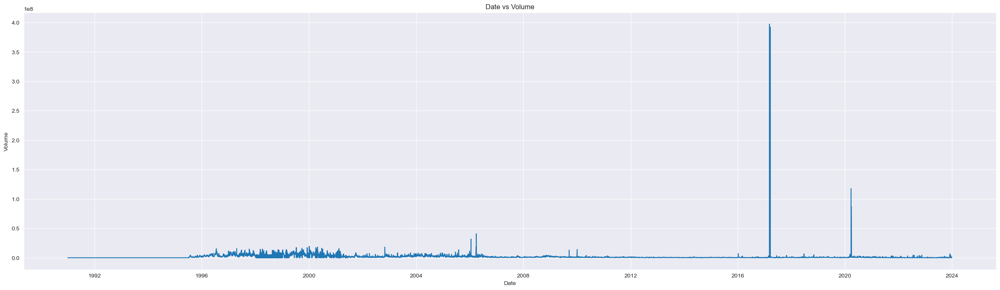

In [24]:
figure=plt.figure(figsize=(30,8))
plt.plot(reliance['Volume'])
plt.xlabel('Date')
plt.ylabel('Volume')
plt.title('Date vs Volume')
plt.show()

**Insights:**

- There have been huge number of shared in 2017 to 2020. This could be due to the reign of Jio and Investment by top tech gaints like Facebook and Google.
- The thin phase lie between 2008-2016, in this phase there hasn't been big volumes traded during these years.
- Reliance have a strong foot in India and has got the trust of the citizens of India that is a valuable company.

# Finding long-term and short-term trends

**Moving Average**

In [25]:
reliance_ma=reliance.copy()
reliance_ma['30-day MA']=reliance['CP'].rolling(window=30).mean()
reliance_ma['100-day MA']=reliance['CP'].rolling(window=100).mean()

In [26]:
reliance_ma

,OP,HP,LP,CP,Volume,30-day MA,100-day MA
Date,,,,,,,
1991-01-03,107.50,107.50,95.00,97.50,0,NaN,NaN
1991-01-07,105.00,107.50,97.50,105.00,0,NaN,NaN
1991-01-09,105.00,105.00,101.25,102.50,0,NaN,NaN
1991-01-11,102.50,110.00,100.00,108.75,0,NaN,NaN
1991-01-14,107.50,107.50,101.25,103.75,0,NaN,NaN
...,...,...,...,...,...,...,...
2023-12-22,2562.20,2580.55,2548.00,2564.70,524558,2424.910000,2408.5860
2023-12-26,2570.00,2592.90,2563.00,2577.50,90284,2433.683333,2408.8825
2023-12-27,2578.50,2599.35,2572.25,2586.35,103806,2442.198333,2409.6195


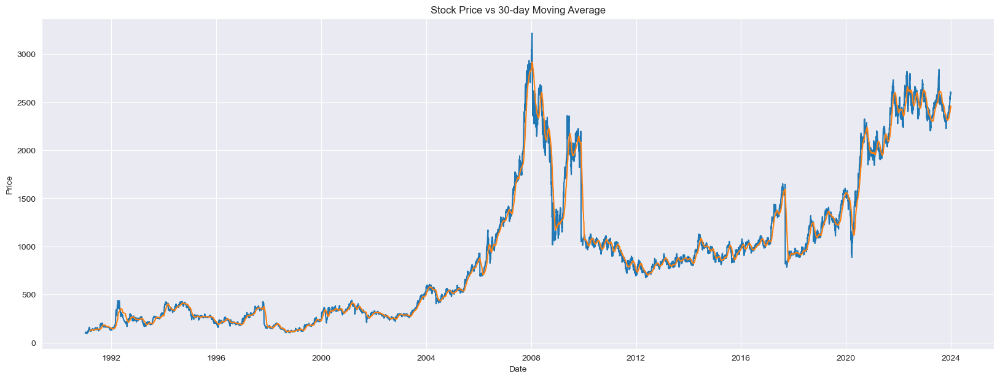

In [27]:
plt.figure(figsize=(20,7))
plt.plot(reliance_ma['CP'],label='Original data')
plt.plot(reliance_ma['30-day MA'],label='30-MA')
plt.legend
plt.title('Stock Price vs 30-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

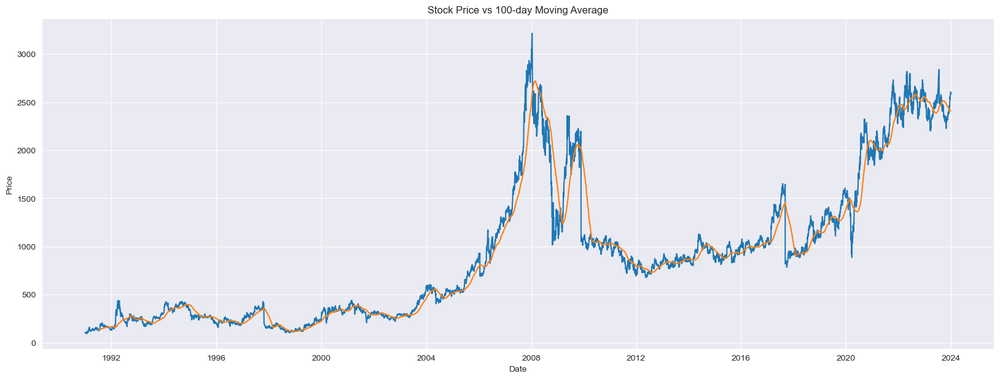

In [28]:
plt.figure(figsize=(20,7))
plt.plot(reliance_ma['CP'],label='Original data')
plt.plot(reliance_ma['100-day MA'],label='100-MA')
plt.legend
plt.title('Stock Price vs 100-day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.show()

**Long term and short term trends can be identified using the Moving Average graphs**

- In long term, Stock price is in upward trend
- Short term trends can be identified from MA-30 chart
- Stock had a major short term downtrend during the year 2020
- It may be due to the bearish market during the Covid-19 outbraek

**2008 Highs:**
Potential factors:
- Strong economic growth in preceding years.
- Company-specific events like acquisitions or expansions.
- Favorable market sentiment towards RIL's sector.

**Overall Insights:**
- A strong uptrend throughout 2007 reflected in the price consistently above the 100-Day MA.
- A sharp decline in late 2008, with the price falling below both the 30-Day and 100-Day MAs, indicating a trend reversal and potential confirmation of a downtrend.
- The price remaining below the 100-Day MA for most of 2009, signifying the continuation of the downtrend due to the aftermath of the 2008 global financial crisis leading to a market crash.
- In 2020, another sharp decline might be visible, with the price falling below both moving averages, indicating a short-term downtrend due to the COVID-19 pandemic.

# Model Building

In [29]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM, GRU

from itertools import cycle

import plotly.graph_objects as go
import plotly.express as px

In [30]:
reliance

,OP,HP,LP,CP,Volume
Date,,,,,
1991-01-03,107.50,107.50,95.00,97.50,0
1991-01-07,105.00,107.50,97.50,105.00,0
1991-01-09,105.00,105.00,101.25,102.50,0
1991-01-11,102.50,110.00,100.00,108.75,0
1991-01-14,107.50,107.50,101.25,103.75,0
...,...,...,...,...,...
2023-12-22,2562.20,2580.55,2548.00,2564.70,524558
2023-12-26,2570.00,2592.90,2563.00,2577.50,90284
2023-12-27,2578.50,2599.35,2572.25,2586.35,103806


In [31]:
# Creating dataframe which only includes date and close time

close_df=pd.DataFrame(reliance['CP'])
close_df

,CP
Date,
1991-01-03,97.50
1991-01-07,105.00
1991-01-09,102.50
1991-01-11,108.75
1991-01-14,103.75
...,...
2023-12-22,2564.70
2023-12-26,2577.50
2023-12-27,2586.35


In [32]:
print(close_df.shape)

(8249, 1)


In [33]:
close_df=close_df.reset_index()

In [34]:
close_df['Date']

0      1991-01-03
1      1991-01-07
2      1991-01-09
3      1991-01-11
4      1991-01-14
          ...    
8244   2023-12-22
8245   2023-12-26
8246   2023-12-27
8247   2023-12-28
8248   2023-12-29
Name: Date, Length: 8249, dtype: datetime64[ns]

**Normalizing / scaling close value between 0 to 1**

In [35]:
close_stock = close_df.copy()
del close_df['Date']
scaler=MinMaxScaler(feature_range=(0,1))
closedf=scaler.fit_transform(np.array(close_df).reshape(-1,1))
print(closedf.shape)

(8249, 1)


**Split data for training and testing**

Ratio for training and testing data is 86:14

In [36]:
training_size=int(len(closedf)*0.86)
test_size=len(closedf)-training_size
train_data,test_data=closedf[0:training_size,:],closedf[training_size:len(closedf),:1]
print("train_data: ", train_data.shape)
print("test_data: ", test_data.shape)

train_data:  (7094, 1)
test_data:  (1155, 1)


**Create new dataset according to requirement of time-series prediction**

In [37]:
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]   ###i=0, 0,1,2,3-----99   100 
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return np.array(dataX), np.array(dataY)

In [38]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 60
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)

print("X_train: ", X_train.shape)
print("y_train: ", y_train.shape)
print("X_test: ", X_test.shape)
print("y_test", y_test.shape)

X_train:  (7033, 60)
y_train:  (7033,)
X_test:  (1094, 60)
y_test (1094,)


# - ML Model

# Support vector regression - SVR

In [39]:
import math
from sklearn.svm import SVR

svr_rbf = SVR(kernel= 'rbf', C= 1e3, gamma= 0.01)
svr_rbf.fit(X_train, y_train)

SVR(C=1000.0, gamma=0.01)

In [40]:
# Lets Do the prediction 

train_predict=svr_rbf.predict(X_train)
test_predict=svr_rbf.predict(X_test)

train_predict = train_predict.reshape(-1,1)
test_predict = test_predict.reshape(-1,1)

print("Train data prediction:", train_predict.shape)
print("Test data prediction:", test_predict.shape)

Train data prediction: (7033, 1)
Test data prediction: (1094, 1)


In [41]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

**Evaluation metrices RMSE, MSE and MAE**

Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [42]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  159.4750759880215
Train data MSE:  25432.29986138523
Test data MAE:  141.65132857103188
-------------------------------------------------------------------------------------
Test data RMSE:  131.36699457218012
Test data MSE:  17257.287262927202
Test data MAE:  109.58314166294636


**Explained variance regression score**

The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [43]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9261169264998339
Test data explained variance regression score: 0.953919373194458


**R2 score for regression**

R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best

0 or < 0 = worse

In [44]:
train_r2_svr=r2_score(original_ytrain, train_predict)
test_r2_svr=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_svr)
print("Test data R2 score:", test_r2_svr)

Train data R2 score: 0.9196754698651167
Test data R2 score: 0.9108652751228379


**Comparision between original stock close price vs predicted close price**

In [45]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])

plotdf = pd.DataFrame({'Date': close_stock['Date'], 'original_close': close_stock['CP'],'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],plotdf['test_predicted_close']],labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (8249, 1)
Test predicted data:  (8249, 1)


**Predicting next 5 years (1827 days)**

In [46]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 1827
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        
        yhat = svr_rbf.predict(x_input)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat.tolist())
        temp_input=temp_input[1:]
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        yhat = svr_rbf.predict(x_input)
        
        temp_input.extend(yhat.tolist())
        lst_output.extend(yhat.tolist())
        
        i=i+1
        
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  1827


**Plotting last 60 days and next predicted 5 years (1827 days)**

In [47]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60]
[  61   62   63 ... 1885 1886 1887]


In [48]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 60 days close price','Predicted next 5 Years (1827 days) close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 60 days vs next 5 years',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

**Plotting whole closing stock price with prediction**

In [49]:
svrdf=closedf.tolist()
svrdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
svrdf=scaler.inverse_transform(svrdf).reshape(1,-1).tolist()[0]

names = cycle(['Close Price'])

fig = px.line(svrdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

# LSTM

In [50]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

print("X_train: ", X_train.shape)
print("X_test: ", X_test.shape)

X_train:  (7033, 60, 1)
X_test:  (1094, 60, 1)


**- LSTM model structure**

In [51]:
tf.keras.backend.clear_session()
model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(time_step,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
#model.compile(loss='mean_squared_error',optimizer='adam')

In [52]:
# Compile and train the model
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train, y_train, batch_size=1, epochs=1)

7033/7033 [==============================] - 588s 82ms/step - loss: 9.7153e-04


In [53]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 60, 50)            10400     
                                                                 
 lstm_1 (LSTM)               (None, 60, 50)            20200     
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 50,851
Trainable params: 50,851
Non-trainable params: 0
_________________________________________________________________


In [54]:
model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=10,batch_size=32,verbose=1)

Epoch 1/10
220/220 [==============================] - 52s 192ms/step - loss: 1.5481e-04 - val_loss: 2.2730e-04
Epoch 2/10
220/220 [==============================] - 39s 175ms/step - loss: 1.3451e-04 - val_loss: 2.1359e-04
Epoch 3/10
220/220 [==============================] - 38s 175ms/step - loss: 1.2610e-04 - val_loss: 1.9215e-04
Epoch 4/10
220/220 [==============================] - 36s 164ms/step - loss: 1.1906e-04 - val_loss: 1.9935e-04
Epoch 5/10
220/220 [==============================] - 35s 157ms/step - loss: 1.1467e-04 - val_loss: 1.7710e-04
Epoch 6/10
220/220 [==============================] - 34s 153ms/step - loss: 1.0521e-04 - val_loss: 2.2354e-04
Epoch 7/10
220/220 [==============================] - 38s 171ms/step - loss: 1.0398e-04 - val_loss: 2.2075e-04
Epoch 8/10
220/220 [==============================] - 37s 166ms/step - loss: 9.9736e-05 - val_loss: 2.4110e-04
Epoch 9/10
220/220 [==============================] - 35s 161ms/step - loss: 9.5554e-05 - val_loss: 7.2688e-04
E

In [55]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)
train_predict.shape, test_predict.shape

35/35 [==============================] - 2s 53ms/step


((7033, 1), (1094, 1))

In [56]:
# Transform back to original form

train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
original_ytrain = scaler.inverse_transform(y_train.reshape(-1,1)) 
original_ytest = scaler.inverse_transform(y_test.reshape(-1,1)) 

**Evaluation metrices RMSE, MSE and MAE**

Root Mean Square Error (RMSE), Mean Square Error (MSE) and Mean absolute Error (MAE) are a standard way to measure the error of a model in predicting quantitative data.

In [57]:
# Evaluation metrices RMSE and MAE
print("Train data RMSE: ", math.sqrt(mean_squared_error(original_ytrain,train_predict)))
print("Train data MSE: ", mean_squared_error(original_ytrain,train_predict))
print("Test data MAE: ", mean_absolute_error(original_ytrain,train_predict))
print("-------------------------------------------------------------------------------------")
print("Test data RMSE: ", math.sqrt(mean_squared_error(original_ytest,test_predict)))
print("Test data MSE: ", mean_squared_error(original_ytest,test_predict))
print("Test data MAE: ", mean_absolute_error(original_ytest,test_predict))

Train data RMSE:  31.793169885190046
Train data MSE:  1010.8056513485553
Test data MAE:  15.80557542440479
-------------------------------------------------------------------------------------
Test data RMSE:  49.75418457814047
Test data MSE:  2475.478883035671
Test data MAE:  39.97179042111802


**Explained variance regression score**

The explained variance score explains the dispersion of errors of a given dataset, and the formula is written as follows: Here, and Var(y) is the variance of prediction errors and actual values respectively. Scores close to 1.0 are highly desired, indicating better squares of standard deviations of errors.

In [58]:
print("Train data explained variance regression score:", explained_variance_score(original_ytrain, train_predict))
print("Test data explained variance regression score:", explained_variance_score(original_ytest, test_predict))

Train data explained variance regression score: 0.9969422586666753
Test data explained variance regression score: 0.9925737994967443


**R2 score for regression**

R-squared (R2) is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

1 = Best 0 or < 0 = worse

In [59]:
train_r2_lstm=r2_score(original_ytrain, train_predict)
test_r2_lstm=r2_score(original_ytest, test_predict)
print("Train data R2 score:", train_r2_lstm)
print("Test data R2 score:", test_r2_lstm)

Train data R2 score: 0.996807505044971
Test data R2 score: 0.9872140316252009


**Comparision between original stock close price vs predicted close price**

In [60]:
# shift train predictions for plotting

look_back=time_step
trainPredictPlot = np.empty_like(closedf)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
print("Train predicted data: ", trainPredictPlot.shape)

# shift test predictions for plotting
testPredictPlot = np.empty_like(closedf)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(closedf)-1, :] = test_predict
print("Test predicted data: ", testPredictPlot.shape)

names = cycle(['Original close price','Train predicted close price','Test predicted close price'])


plotdf = pd.DataFrame({'Date': close_stock['Date'],
                       'original_close': close_stock['CP'],
                      'train_predicted_close': trainPredictPlot.reshape(1,-1)[0].tolist(),
                      'test_predicted_close': testPredictPlot.reshape(1,-1)[0].tolist()})

fig = px.line(plotdf,x=plotdf['Date'], y=[plotdf['original_close'],plotdf['train_predicted_close'],
                                          plotdf['test_predicted_close']],
              labels={'value':'Stock price','Date': 'Date'})
fig.update_layout(title_text='Comparision between original close price vs predicted close price',
                  plot_bgcolor='white', font_size=15, font_color='black', legend_title_text='CP')
fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

Train predicted data:  (8249, 1)
Test predicted data:  (8249, 1)


**Predicting next 5 years (1827 days)**

In [61]:
x_input=test_data[len(test_data)-time_step:].reshape(1,-1)
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

from numpy import array

lst_output=[]
n_steps=time_step
i=0
pred_days = 1827
while(i<pred_days):
    
    if(len(temp_input)>time_step):
        
        x_input=np.array(temp_input[1:])
        #print("{} day input {}".format(i,x_input))
        x_input = x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        
        yhat = model.predict(x_input, verbose=0)
        #print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
       
        lst_output.extend(yhat.tolist())
        i=i+1
        
    else:
        
        x_input = x_input.reshape((1, n_steps,1))
        yhat = model.predict(x_input, verbose=0)
        temp_input.extend(yhat[0].tolist())
        
        lst_output.extend(yhat.tolist())
        i=i+1
               
print("Output of predicted next days: ", len(lst_output))

Output of predicted next days:  1827


**Plotting last 60 days and next predicted 5 years (1827 days)**

In [62]:
last_days=np.arange(1,time_step+1)
day_pred=np.arange(time_step+1,time_step+pred_days+1)
print(last_days)
print(day_pred)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53 54 55 56 57 58 59 60]
[  61   62   63 ... 1885 1886 1887]


In [63]:
temp_mat = np.empty((len(last_days)+pred_days+1,1))
temp_mat[:] = np.nan
temp_mat = temp_mat.reshape(1,-1).tolist()[0]

last_original_days_value = temp_mat
next_predicted_days_value = temp_mat

last_original_days_value[0:time_step+1] = scaler.inverse_transform(closedf[len(closedf)-time_step:]).reshape(1,-1).tolist()[0]
next_predicted_days_value[time_step+1:] = scaler.inverse_transform(np.array(lst_output).reshape(-1,1)).reshape(1,-1).tolist()[0]

new_pred_plot = pd.DataFrame({
    'last_original_days_value':last_original_days_value,
    'next_predicted_days_value':next_predicted_days_value
})

names = cycle(['Last 60 days close price','Predicted next 5 years (1827 days) close price'])

fig = px.line(new_pred_plot,x=new_pred_plot.index, y=[new_pred_plot['last_original_days_value'],
                                                      new_pred_plot['next_predicted_days_value']],
              labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Compare last 60 days vs next 5 years',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Close Price')

fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

**Plotting whole closing stock price with prediction**

In [64]:
lstmdf=closedf.tolist()
lstmdf.extend((np.array(lst_output).reshape(-1,1)).tolist())
lstmdf=scaler.inverse_transform(lstmdf).reshape(1,-1).tolist()[0]

names = cycle(['Close Price'])

fig = px.line(lstmdf,labels={'value': 'Stock price','index': 'Timestamp'})
fig.update_layout(title_text='Plotting whole closing stock price with prediction',
                  plot_bgcolor='white', font_size=15, font_color='black',legend_title_text='Stock')

fig.for_each_trace(lambda t:  t.update(name = next(names)))

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)
fig.show()

In [65]:
finaldf = pd.DataFrame({
    'svr':svrdf,
    #'knn':knndf,
    'lstm':lstmdf,
})
finaldf

,svr,lstm
0,97.500000,97.500000
1,105.000000,105.000000
2,102.500000,102.500000
3,108.750000,108.750000
4,103.750000,103.750000
...,...,...
10071,6395.469992,3394.889549
10072,6394.767392,3394.889176
10073,6394.453496,3394.888804
10074,6394.563466,3394.888059


# Conclusion Chart

In [66]:
names = cycle(['SVR','LSTM'])

fig = px.line(finaldf[225:], x=finaldf.index[225:], y=[finaldf['svr'][225:], finaldf['lstm'][225:]],
             labels={'x': 'Timestamp','value':'Stock close price'})
fig.update_layout(title_text='Final stock analysis chart', font_size=15, font_color='black',legend_title_text='Algorithms')
fig.for_each_trace(lambda t:  t.update(name = next(names)))
fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

In [67]:
data={"Model": ["SVR", "LSTM"],
    "Train R2 Score": [train_r2_svr, train_r2_lstm],
    "Test R2 Score": [test_r2_svr, test_r2_lstm]}
df=pd.DataFrame(data)
df

,Model,Train R2 Score,Test R2 Score
0,SVR,0.919675,0.910865
1,LSTM,0.996808,0.987214


**By Looking into this table we can say that our LSTM model have best R2 scores in Training and Testing. So we are going to use LSTM model for our deployment part.**



In [68]:
from pickle import dump
dump(model,open('lstm_model.pkl','wb'))